In [1]:
from numpy import *
from matplotlib.pyplot import *
import matplotlib.animation as animation
from JSAnimation import IPython_display
%matplotlib inline

# Ejercicio 1




In [2]:
def sucesion(cond_ini, epsilon, N=2000, tau=1.):
    cond = zeros((N,2))
    cond[0] = cond_ini
    for i in xrange(1, N):
        cond[i,1] = cond[i-1,1] + epsilon*sin(cond[i-1,0])
        cond[i,0] = (cond[i-1,0] + cond[i,1]*tau)%(2*pi)
        
    return cond[:,0], cond[:,1]

def mapeo(epsilon, ax, n=200, N=2000, tau=1.):
    for i in xrange(n):
        cond_ini = array([2.0*pi*random.rand(), pi*(random.rand()-0.5)])
        x, y = sucesion(cond_ini, epsilon, N, tau)
        ax.plot(x, y, '.', markersize=0.1)
        ax.set_title("$\epsilon = {}$".format(epsilon), fontsize=20)
        ax.set_xlabel("$\\theta$", fontsize=20)
        ax.set_ylabel("$p$", fontsize=20)
        ax.set_xlim(0,2*pi)
        ax.set_ylim(-2,2)

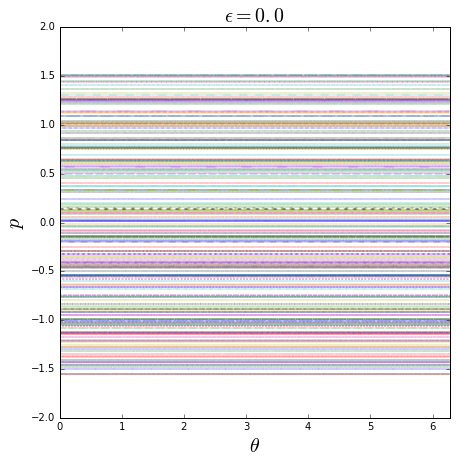

In [3]:
fig = figure(figsize=(7,7))
ax = fig.add_subplot(111)
mapeo(0., ax, n=200, N=2000)

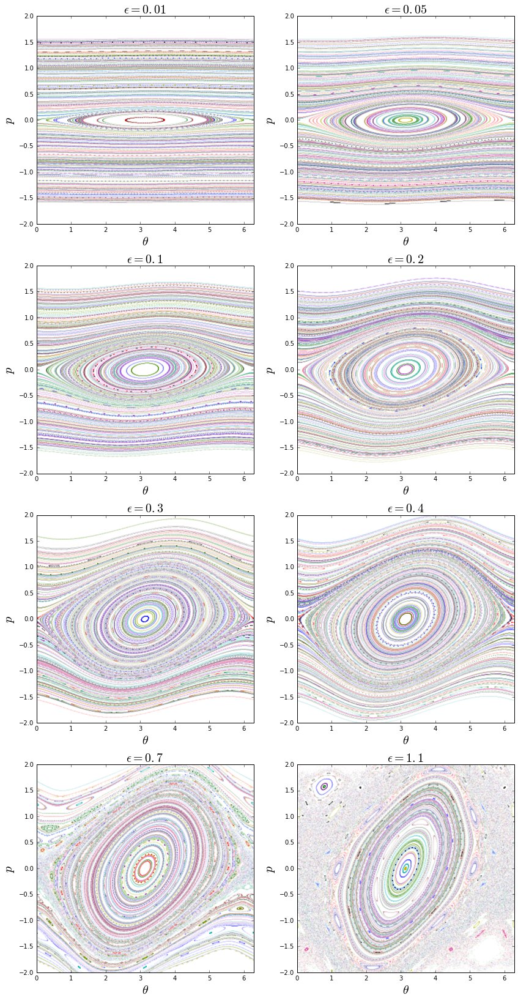

In [4]:
fig, axarr = subplots(4, 2, figsize=(14,28))
eps = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.7, 1.1]
for i in range(4):
    for j in range(2):
        mapeo(eps[i*2+j], axarr[i,j], n=300, N=1000)


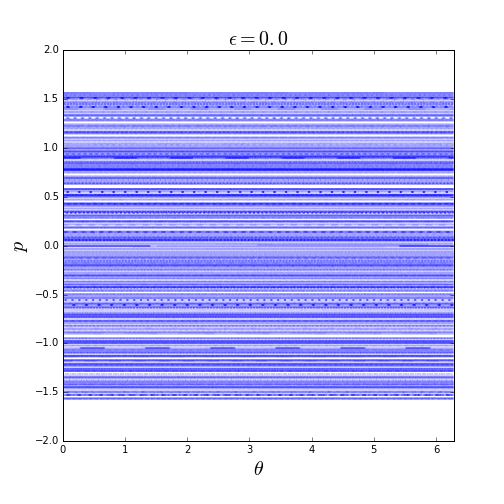
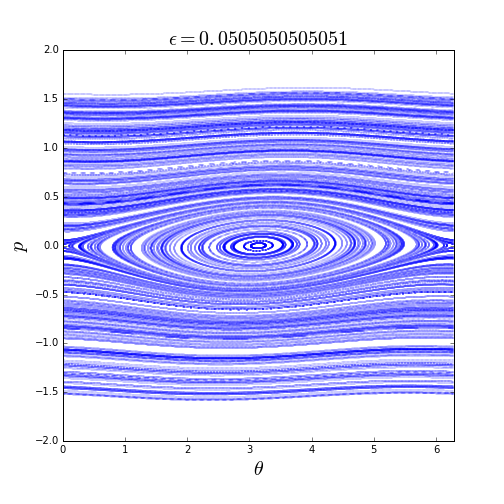
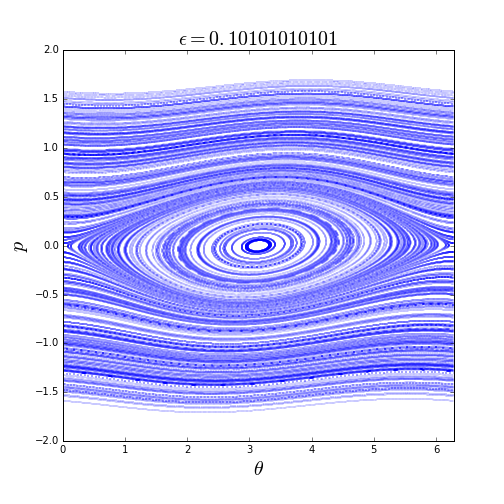
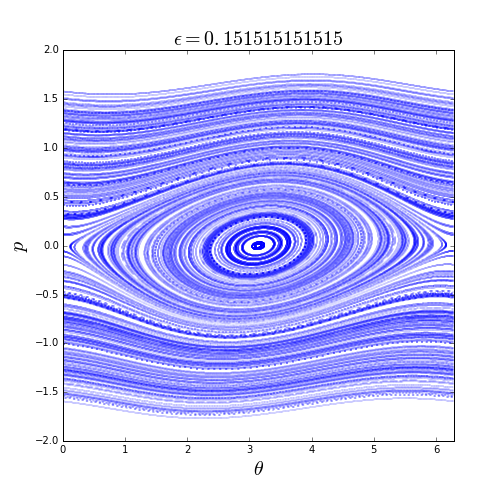
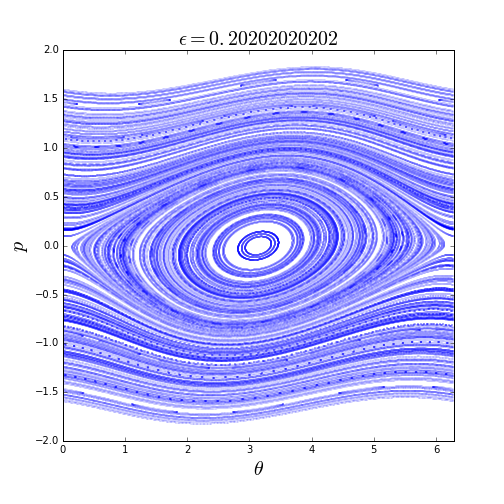
...
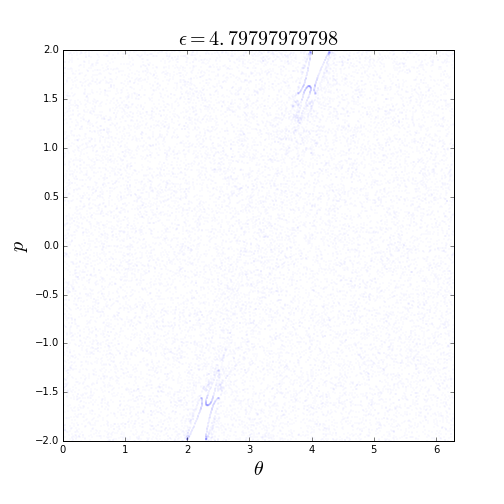
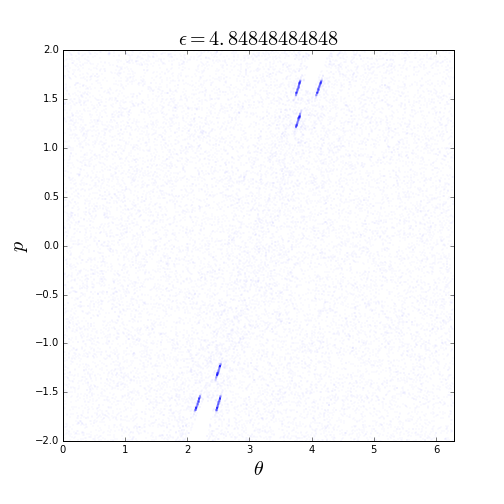
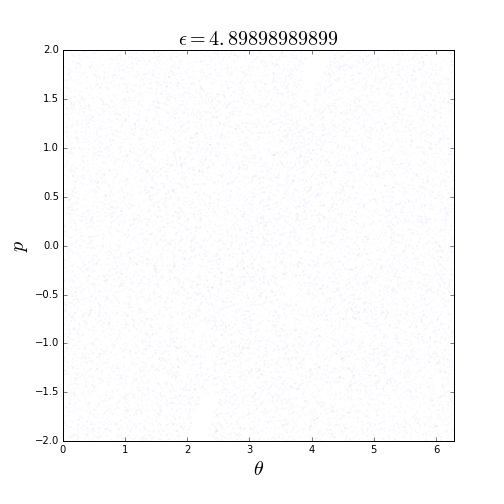
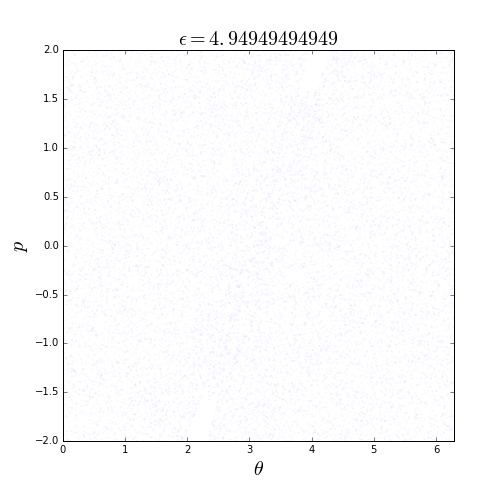
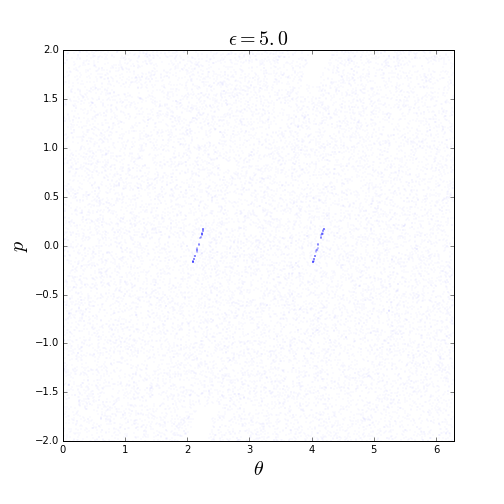

In [7]:
Neps = 100
eps = linspace(0.0,5.0, Neps)
n = 400
N = 2000

fig = figure(figsize=(7,7))
ax = fig.add_subplot(111)
ax.set_xlabel("$\\theta$", fontsize=20)
ax.set_ylabel("$p$", fontsize=20)
ax.set_xlim(0,2*pi)
ax.set_ylim(-2,2)
        
mapeoanim, = ax.plot([], [], '.', markersize=0.1)
def init():
    mapeoanim.set_data([], [])
    return mapeoanim,

def animate(i):
    x, y = zeros(n*N), zeros(n*N)
    for j in range(n):
        cond_ini = array([2.0*pi*random.rand(), pi*(random.rand()-0.5)])
        x[N*j:N*(j+1)], y[N*j:N*(j+1)] = sucesion(cond_ini, eps[i], N)
    mapeoanim.set_data(x, y)
    ax.set_title("$\epsilon = {}$".format(eps[i]), fontsize=20)
    return mapeoanim,

animation.FuncAnimation(fig, animate, init_func=init, frames=Neps)